# Serial Autoencoder Training across Tmaze Environments

This notebook trains a singlhippocampalal autoencoder sequentially across thr e
Tmaze environments (Tmaze_0, Tmaze_1, Tmaze_2). The same model is carried from  ne
environment to the next, so each environment continues training the weights lef  by
the previous one, modeling continual exposure rather than independent runs. Se ting
`reverse_envs = True` flips the order to Tmaze_2, Tmaze_1, Tmaze_0.hippocampal 

The aut (Amil et al, 2024)oencoder takes the agent's RGB visual input as both input and tar et, and
learns a compressed latent code under a whitening constraint on the hid en layer
(controlled by `C_factor` and `alpha`) that pushes the units toward de orrelated
activity. A checkpoint is saved at every epoch of every environment, so a y training
stage can be reloaded later for analysis.

After training, the notebook characterizes the latent un ts as spatial
representations. Using the position and orientation logged in eac  environment's
`data.csv`, it computes reconstruction quality on example frames, th  SSCP matrix of
the embeddings (to inspect decorrelation), ratemaps and place field statistics
(number, centroids, and sizes of fields per unit), centroid density across the arena,
and polarmaps (orientation tuning).

Three flags at the top control how the notebook runs:

1. `model_training`: train from scratch when True, or load an existing checkpoint when False.
2. `save_plots`: write figures to the experiment's plot folder.
3. `batch_training`: at the end, repeat the full serial training over many experiments (replicat

Hippocampal autoencoder ref: Amil, A. F., Freire, I. T., & Verschure, P. F. (2024). Discretization of continuous input spaces in the hippocampal autoencoder. arXiv preprint arXiv:2405.14600.es) to gather statistics.

### Import libraries

In [2]:
%matplotlib inline
import os
import sys
import pathlib
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt

### Import Autoencoder Functions

In [4]:
folder_path = str(pathlib.Path().resolve().parents[1])
print("Folder path =", folder_path)
sys.path.append(folder_path + '/Notebooks/Spatial_AE/')

from model import *
from data import *
from dataloaders import *
from training import *
from analysis import *
from plotting import *

Folder path = C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps


### Check GPU 

In [6]:
print("CUDA is available =", torch.cuda.is_available())
print("CUDA device count =", torch.cuda.device_count())
if torch.cuda.device_count() > 1:
    os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
#print(torch.cuda.current_device())
#print(torch.cuda.device(0))
print("CUDA device name =", torch.cuda.get_device_name(0))

CUDA is available = True
CUDA device count = 2
CUDA device name = NVIDIA RTX A5000


### Hyperparameters

In [9]:
#Experiment
model_training = False
save_plots = True

reverse_envs = False

#Model
n_hidden = 200
batch_size = 256
num_epochs = 100
learning_rate = 1e-4
C_factor = 1e3
alpha = 1e5

#Ratemaps
trial_t = 0

peak_as_centroid=True
min_pix_cluster=0.02
max_pix_cluster=0.5
active_threshold=0.2

### Dataset variables

In [11]:
envs = ['Tmaze_0', 'Tmaze_1', 'Tmaze_2']
if reverse_envs == True: envs = ['Tmaze_2', 'Tmaze_1', 'Tmaze_0']
env = envs[0] #Choose environment index
data_path, csv_filename, num_images = format_dataset(folder_path, env)

print("Dataset Environment =", env)
print("Num. Images in Dataset =", num_images)
print("Dataset Path =", data_path)
print("CSV path =    ", csv_filename)

Dataset Environment = Tmaze_0
Num. Images in Dataset = 39510
Dataset Path = C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Datasets/Tmaze_0
CSV path =     C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Datasets/Tmaze_0/data.csv


### Model name

In [13]:
foldername = 'Exp1-NEpisodes' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate)
if reverse_envs == True:
    foldername = 'Reverse' + foldername

model_folder_path = folder_path + '/Models/Experiment1/'
plot_folder_path = folder_path + '/Plots/Experiment1/'

check_model_folders(model_folder_path, foldername)
check_plot_folders(plot_folder_path, foldername)

model_folder_path = model_folder_path + foldername
plot_folder_path = plot_folder_path + foldername

loss_csv_filename = model_folder_path + '/loss_history.csv'

print("Model path =", model_folder_path)
print("Plot path  =", plot_folder_path)
print("Loss path  =", loss_csv_filename)

Model path = C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Exp1-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001
Plot path  = C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Plots/Exp1-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001
Loss path  = C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Exp1-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/loss_history.csv


### Import image dataset and CSV data

In [15]:
dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)
Tmaze0_data, Tmaze0_position, Tmaze0_orientation = load_csv(csv_filename, num_images)

print("Dataset Environment =", env)
print("Dataset Shape =", dataset.shape)
print("Position Shape =", Tmaze0_position.shape)
print()
Tmaze0_data

Dataset Environment = Tmaze_0
Dataset Shape = (39510, 120, 160, 3)
Position Shape = (39510, 2)



,Trial_number,Trial_time,Frame_ID,X,Y,Z,Internal_states,RewardID,Row_index
0,1,0.415,1,0.000,-0.457,270.045,"[0.25441, 0.64963]",0,0
1,1,0.915,2,0.008,-0.456,228.610,"[0.25391, 0.64913]",0,1
2,1,1.415,3,-0.009,-0.440,238.945,"[0.25341, 0.64863]",0,2
3,1,1.915,4,-0.027,-0.411,246.985,"[0.25291, 0.64813]",0,3
4,1,2.415,5,-0.042,-0.367,260.350,"[0.25241, 0.64763]",0,4
...,...,...,...,...,...,...,...,...,...
39505,11,910.215,39995,0.011,0.253,133.613,"[-4e-05, -5e-05]",2,39994
39506,11,910.715,39996,-0.007,0.233,114.877,"[-4e-05, -5e-05]",2,39995
39507,11,911.215,39997,-0.019,0.196,98.255,"[-4e-05, -5e-05]",2,39996
39508,11,911.715,39998,-0.024,0.201,71.253,"[-4e-05, -5e-05]",2,39997


### Display example image

Image shape = (120, 160, 3)


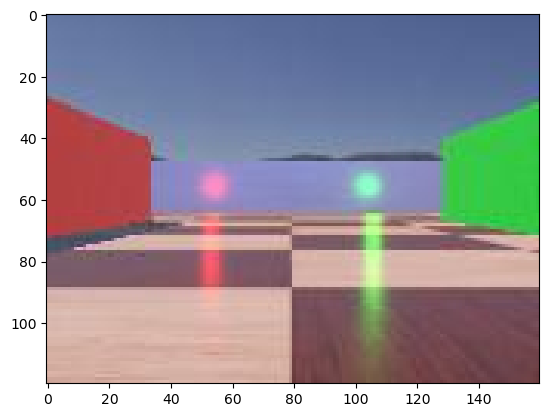

In [17]:
idx = 0
plt.imshow(dataset[idx])
print("Image shape =", dataset[idx].shape)

### Model training

In [19]:
if model_training == True:
    loss = []
    model = Conv_AE(n_hidden=n_hidden)
    train_loader = create_dataloader(dataset, batch_size=batch_size)

    #Save untrained model
    trial_t = 0
    model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
    model_path = model_folder_path + '/' + model_filename
    torch.save(model.state_dict(), model_path)
    
    for i in range(num_epochs):
        #Train model
        history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
        loss.append(history[0])

        #Save model
        trial_t = i + 1
        model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
        model_path = model_folder_path + '/' + model_filename
        torch.save(model.state_dict(), model_path)

## Update dataset to next environment

In [21]:
env = envs[1]
data_path, csv_filename, num_images = format_dataset(folder_path, env)
dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)

Tmaze1_data, Tmaze1_position, Tmaze1_orientation = load_csv(csv_filename, num_images)

print("New Environment =", env)
print("Num. Images in Dataset =", num_images)
print("Dataset Shape =", dataset.shape)
print("Position Shape =", Tmaze1_position.shape)
print()

New Environment = Tmaze_1
Num. Images in Dataset = 39906
Dataset Shape = (39906, 120, 160, 3)
Position Shape = (39906, 2)



#### Display example image

Image shape = (120, 160, 3)


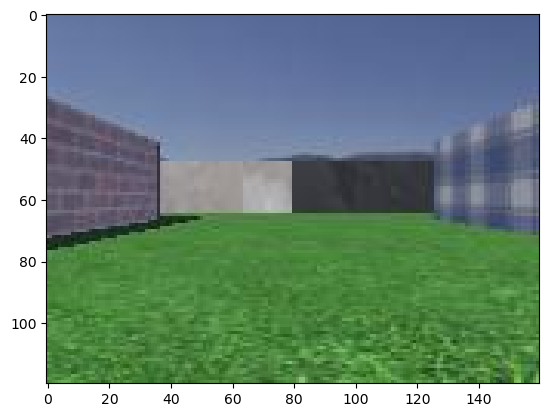

In [23]:
plt.imshow(dataset[idx])
print("Image shape =", dataset[idx].shape)

#### Model training

In [25]:
if model_training == True:
    train_loader = create_dataloader(dataset, batch_size=batch_size)
    for i in range(num_epochs):
        #Train model
        history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
        loss.append(history[0])

        #Save model
        trial_t = i + 1
        model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
        model_path = model_folder_path + '/' + model_filename
        torch.save(model.state_dict(), model_path)

## Update dataset to next environment

In [27]:
env = envs[2]
data_path, csv_filename, num_images = format_dataset(folder_path, env)
dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)

Tmaze2_data, Tmaze2_position, Tmaze2_orientation = load_csv(csv_filename, num_images)

print("New Environment =", env)
print("Num. Images in Dataset =", num_images)
print("Dataset Shape =", dataset.shape)
print("Position Shape =", Tmaze2_position.shape)
print()

New Environment = Tmaze_2
Num. Images in Dataset = 41956
Dataset Shape = (41956, 120, 160, 3)
Position Shape = (41956, 2)



#### Display example image

Image shape = (120, 160, 3)


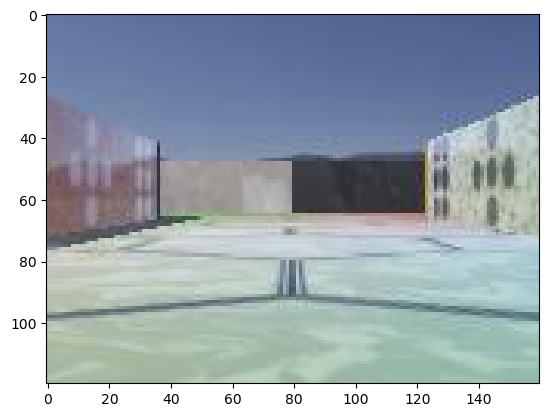

In [29]:
plt.imshow(dataset[idx])
print("Image shape =", dataset[idx].shape)

#### Model training

In [31]:
if model_training == True:
    train_loader = create_dataloader(dataset, batch_size=batch_size)
    for i in range(num_epochs):
        #Train model
        history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
        loss.append(history[0])

        #Save model
        trial_t = i + 1
        model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
        model_path = model_folder_path + '/' + model_filename
        torch.save(model.state_dict(), model_path)

    save_training_loss(loss_csv_filename, loss)

In [32]:
if model_training == True:
    fig = plt.figure(figsize=(6,4))
    plt.plot(loss)
    plt.xlabel('epoch')
    plt.ylabel('loss')
    sb.despine()
    plt.suptitle('Loss history', fontsize=15)
    plt.title('Final loss = ' + str(round(loss[-1], 5)), fontsize=10)
    plt.show()
    if save_plots == True:
        fig.savefig(plot_folder_path + '/History_loss.pdf', format='pdf', bbox_inches='tight')
        fig.savefig(plot_folder_path + '/History_loss.png', format='png')

In [34]:
if model_training == False:
    env = envs[2]
    data_path, csv_filename, num_images = format_dataset(folder_path, env)
    dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)
    
    model_filename =  env + '-Trial' + str(100) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
    model_path = model_folder_path + '/' + model_filename
    
    model = Conv_AE(n_hidden=n_hidden)
    model.load_state_dict(torch.load(model_path))
    print("Model loaded:", model_path)

Model loaded: C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Exp1-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/Tmaze_2-Trial3of3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001.pth


## Check Results (Last training episode)

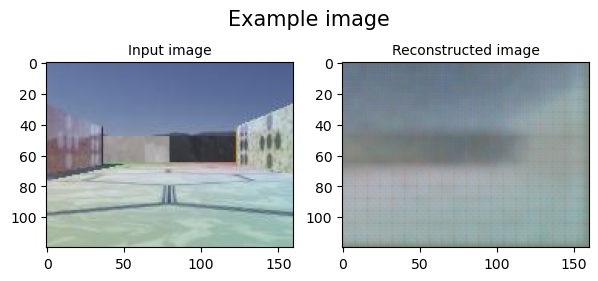

In [35]:
fig = plt.figure(figsize=(7,3))
plt.subplot(121)
plt.imshow(dataset[idx])
plt.suptitle('Example image', fontsize=15)
plt.title('Input image', fontsize=10)
plt.subplot(122)
plt.imshow(predict(dataset[idx], model))
plt.title('Reconstructed image', fontsize=10)

plt.show()
if save_plots == True:
    fig.savefig(plot_folder_path + '/Image_reconstruction.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/Image_reconstruction.png', format='png')

In [36]:
embeddings = get_latent_vectors(dataset, model, batch_size=batch_size)

In [37]:
all_ratemaps = ratemaps(embeddings, Tmaze2_position, n_bins=50, filter_width=3)

In [96]:
plot_ratemaps(all_ratemaps[:100], plot_folder_path, save=save_plots)

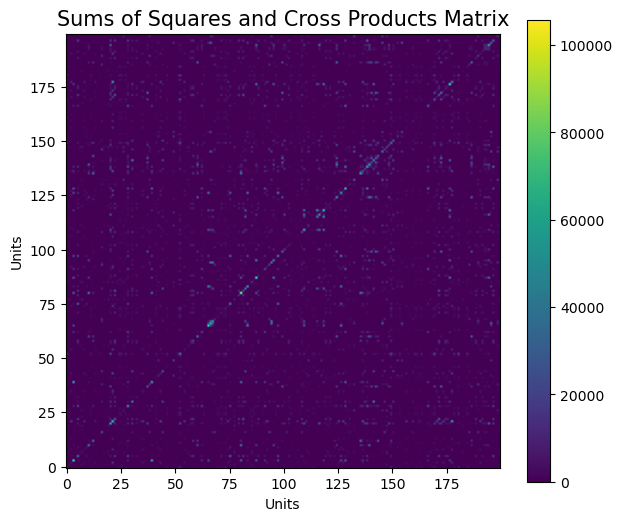

In [97]:
sscp = np.dot(embeddings.T, embeddings)

fig = plt.figure(figsize=(7,6))
plt.title('Sums of Squares and Cross Products Matrix', fontsize=15)
plt.imshow(sscp, origin='lower')
plt.xlabel('Units')
plt.ylabel('Units')
plt.colorbar()
plt.show()
if save_plots == True:
    fig.savefig(plot_folder_path + '/sscp.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/sscp.png', format='png')

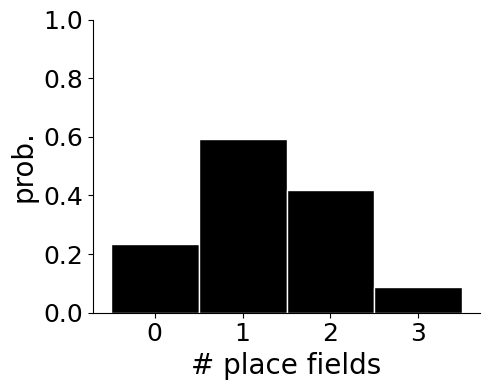

In [98]:
all_num_fields, centroids, sizes = stats_place_fields(all_ratemaps, peak_as_centroid=peak_as_centroid, min_pix_cluster=min_pix_cluster, max_pix_cluster=max_pix_cluster, active_threshold=active_threshold)
centroids_per_field, sizes_per_field = format_centroids(all_num_fields, centroids, sizes)
plot_place_field_hist(all_num_fields, plot_folder_path, save=save_plots)

## Check Results

In [49]:
save_plots = False

### Dataset and Model loading

In [54]:
env_idx = 0
env = envs[env_idx]
trial = 100

envs[env_idx]
data_path, csv_filename, num_images = format_dataset(folder_path, env)
dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)

model_filename =  env + '-Trial' + str(trial) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
model_path = model_folder_path + '/' + model_filename

model = Conv_AE(n_hidden=n_hidden)
model.load_state_dict(torch.load(model_path))
print("Model loaded:", model_path)

loss = load_loss_history(model_folder_path)

Model loaded: C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Exp1-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/Tmaze_0-Trial3of3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001.pth


### Reconstruction performance

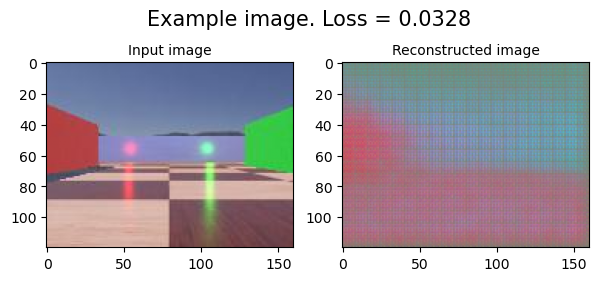

In [55]:
img_indx = 0
loss_idx = (env_idx*num_epochs) + trial
loss[loss_idx]

fig = plt.figure(figsize=(7,3))
plt.subplot(121)
plt.imshow(dataset[img_indx])
plt.suptitle('Example image. Loss = ' + str(round(loss[loss_idx],4)), fontsize=15)
plt.title('Input image', fontsize=10)
plt.subplot(122)
plt.imshow(predict(dataset[img_indx], model))
plt.title('Reconstructed image', fontsize=10)

plt.show()
if save_plots == True:
    fig.savefig(plot_folder_path + '/Image_reconstruction.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/Image_reconstruction.png', format='png')

### Firing fields

In [57]:
embeddings = get_latent_vectors(dataset, model, batch_size=batch_size)

In [58]:
positions = [Tmaze0_position, Tmaze1_position, Tmaze2_position]
position = positions[env_idx]
all_ratemaps = ratemaps(embeddings, position, n_bins=50, filter_width=3)

In [59]:
plot_ratemaps(all_ratemaps[:100], plot_folder_path, save=save_plots)

### SSCP Matrix

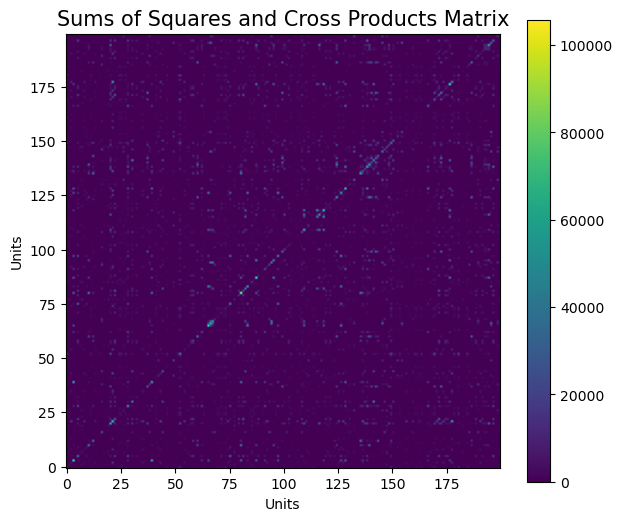

In [61]:
sscp = np.dot(embeddings.T, embeddings)

fig = plt.figure(figsize=(7,6))
plt.title('Sums of Squares and Cross Products Matrix', fontsize=15)
plt.imshow(sscp, origin='lower')
plt.xlabel('Units')
plt.ylabel('Units')
plt.colorbar()
plt.show()
if save_plots == True:
    fig.savefig(plot_folder_path + '/sscp.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/sscp.png', format='png')

In [62]:
all_num_fields, centroids, sizes = stats_place_fields(all_ratemaps, peak_as_centroid=peak_as_centroid, min_pix_cluster=min_pix_cluster, max_pix_cluster=max_pix_cluster, active_threshold=active_threshold)
centroids_per_field, sizes_per_field = format_centroids(all_num_fields, centroids, sizes)

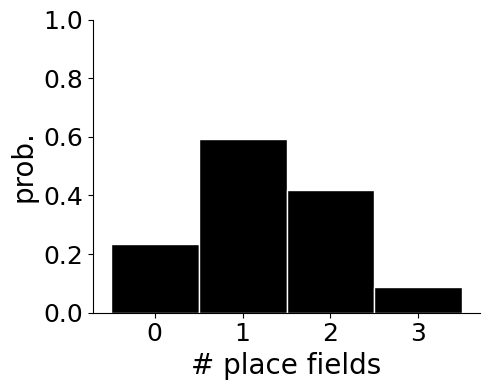

In [63]:
plot_place_field_hist(all_num_fields, plot_folder_path, save=save_plots)

Number of place fields = 2
Size of place fields = [289, 570]
YX position of place fields = [[32, 25], [36, 25]]


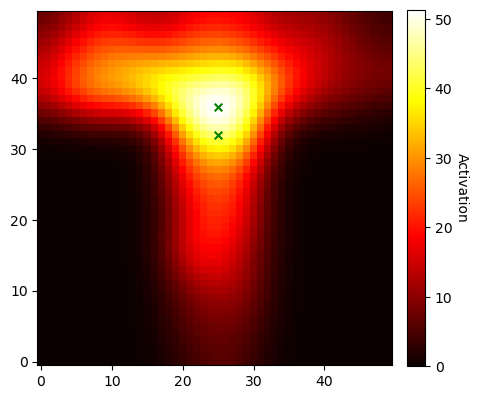

In [64]:
unit = 3
plot_single_ratemap_density(all_ratemaps, unit, all_num_fields, sizes_per_field, centroids_per_field, plot_folder_path, figsize=(5,5), save=save_plots)

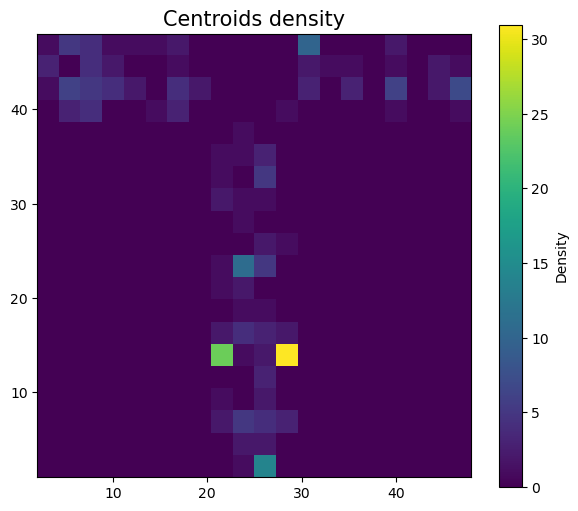

In [65]:
heatmap, xedges, yedges = np.histogram2d(centroids[:,1], centroids[:,0], bins=(20, 20))
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

fig = plt.figure(figsize=(7,6))
plt.imshow(heatmap.T, extent=extent, origin='lower', cmap='viridis')
plt.colorbar(label='Density')
plt.title('Centroids density', fontsize=15)
if save_plots:
    fig.savefig(plot_folder_path + '/Centroids_density.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/Centroids_density.png', format='png')
plt.show()

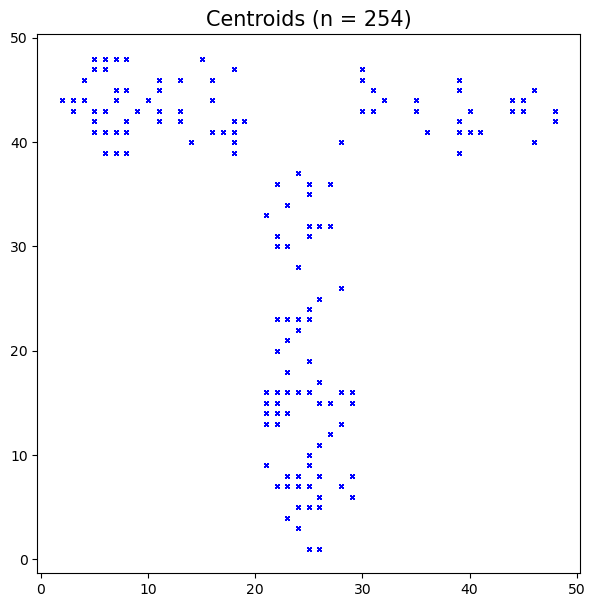

In [66]:
fig = plt.figure(figsize=(7,7))
for i in range(len(centroids)):
    plt.plot(centroids[:,1], centroids[:,0], 'bx', markersize=3)
plt.title("Centroids (n = " + str(len(centroids)) + ")", fontsize=15)
if save_plots:
    fig.savefig(plot_folder_path + '/Centroids.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/Centroids.png', format='png')
plt.show()

In [67]:
max_fields = np.max(all_num_fields)

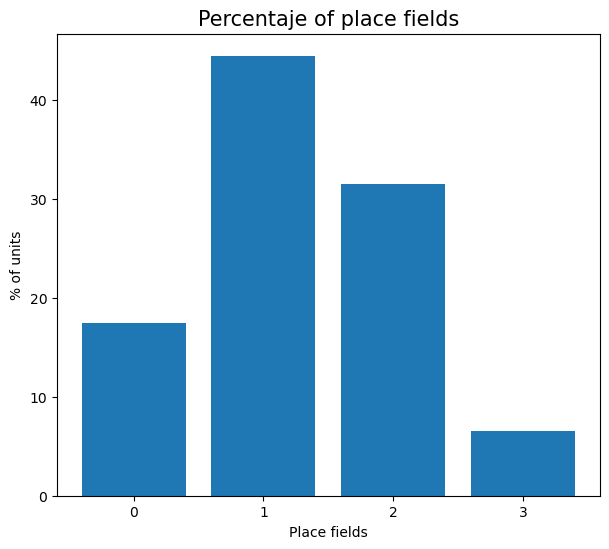

In [68]:
zero_pf = (np.unique(all_num_fields, return_counts=True)[1][0] / n_hidden) * 100
one_pf = (np.unique(all_num_fields, return_counts=True)[1][1] / n_hidden) * 100
two_pf = (np.unique(all_num_fields, return_counts=True)[1][2] / n_hidden) * 100
three_pf = (np.unique(all_num_fields, return_counts=True)[1][3] / n_hidden) * 100

categories = ['0', '1', '2', '3'] #
values = [zero_pf, one_pf, two_pf, three_pf] #

fig = plt.figure(figsize=(7,6))
plt.bar(categories, values)
plt.title('Percentaje of place fields', fontsize=15)
plt.xlabel('Place fields')
plt.ylabel('% of units')
if save_plots:
    fig.savefig(plot_folder_path + '/place_field_histogram.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/place_field_histogram.png', format='png')
plt.show()

In [69]:
polarmaps = polarmaps(embeddings, Tmaze2_orientation)
plot_polarmaps(polarmaps, plot_folder_path, save=save_plots)

# Batch training

In [86]:
batch_training = False

In [94]:
if batch_training == True:
    num_epochs = 100
    starting_experiment = 1
    total_experiments = 20
    current_exp = starting_experiment
    
    envs = ['Tmaze_0', 'Tmaze_1', 'Tmaze_2']
    
    
    while current_exp <= total_experiments:
        model_folder_path = folder_path + '/Models/Experiment1/'
        print()
        print('---------- ---------- ---------- ---------- ----------')
        print('STARTING EXPERIMENT', str(current_exp))
        
        env = envs[0]
        data_path, csv_filename, num_images = format_dataset(folder_path, env)
        foldername = 'Exp' + str(current_exp) + '-NEpisodes' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate)
    
        check_model_folders(model_folder_path, foldername)
    
        model_folder_path = model_folder_path + foldername
        loss_csv_filename = model_folder_path + '/loss_history.csv'
    
    
        ################# TRAINING PHASE 1 #################
        dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)
        Tmaze0_data, Tmaze0_position, Tmaze0_orientation = load_csv(csv_filename, num_images)
    
        loss = []
        model = Conv_AE(n_hidden=n_hidden)
        train_loader = create_dataloader(dataset, batch_size=batch_size)
        
        trial_t = 0
        model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
        model_path = model_folder_path + '/' + model_filename
        torch.save(model.state_dict(), model_path)
    
        for i in range(num_epochs):
            #Train model
            history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
            loss.append(history[0])
    
            #Save model
            trial_t = i + 1
            model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
            model_path = model_folder_path + '/' + model_filename
            torch.save(model.state_dict(), model_path)
    
    
        ################# TRAINING PHASE 2 #################
        env = envs[1]
        data_path, csv_filename, num_images = format_dataset(folder_path, env)
        dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)
        
        Tmaze1_data, Tmaze1_position, Tmaze1_orientation = load_csv(csv_filename, num_images)
        train_loader = create_dataloader(dataset, batch_size=batch_size)
        
        for i in range(num_epochs):
            history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
            loss.append(history[0])
    
            trial_t = i + 1
            model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
            model_path = model_folder_path + '/' + model_filename
            torch.save(model.state_dict(), model_path)
    
        
        ################# TRAINING PHASE 3 #################
        env = envs[2]
        data_path, csv_filename, num_images = format_dataset(folder_path, env)
        dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)
        
        Tmaze2_data, Tmaze2_position, Tmaze2_orientation = load_csv(csv_filename, num_images)
        train_loader = create_dataloader(dataset, batch_size=batch_size)
        
        for i in range(num_epochs):
            history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
            loss.append(history[0])
    
            trial_t = i + 1
            model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
            model_path = model_folder_path + '/' + model_filename
            torch.save(model.state_dict(), model_path)
    
        save_training_loss(loss_csv_filename, loss)
        current_exp += 1


---------- ---------- ---------- ---------- ----------
STARTING EXPERIMENT 1


Epoch 1/1, Loss: 0.0211: 100%|███████████████████████████████████████████████████████| 164/164 [00:14<00:00, 11.67it/s]


Loss History saved at C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Exp1-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/loss_history.csv

---------- ---------- ---------- ---------- ----------
STARTING EXPERIMENT 2
Creating new model folder = Exp2-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001


Epoch 1/1, Loss: 0.0197: 100%|███████████████████████████████████████████████████████| 164/164 [00:13<00:00, 11.78it/s]


Loss History saved at C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Exp2-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/loss_history.csv

---------- ---------- ---------- ---------- ----------
STARTING EXPERIMENT 3
Creating new model folder = Exp3-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001


Epoch 1/1, Loss: 0.0184: 100%|███████████████████████████████████████████████████████| 164/164 [00:13<00:00, 12.01it/s]

Loss History saved at C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Exp3-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/loss_history.csv
